In [67]:
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt 
import numpy as np
from matplotlib import style
style.use('seaborn')

In [68]:
df = pd.read_csv('/home/kanishk/Downloads/dara/pulsar_star/pulsar_stars.csv')

In [69]:
df.head()

,Mean of the integrated profile,Standard deviation of the integrated profile,Excess kurtosis of the integrated profile,Skewness of the integrated profile,Mean of the DM-SNR curve,Standard deviation of the DM-SNR curve,Excess kurtosis of the DM-SNR curve,Skewness of the DM-SNR curve,target_class
0,140.562500,55.683782,-0.234571,-0.699648,3.199833,19.110426,7.975532,74.242225,0
1,102.507812,58.882430,0.465318,-0.515088,1.677258,14.860146,10.576487,127.393580,0
2,103.015625,39.341649,0.323328,1.051164,3.121237,21.744669,7.735822,63.171909,0
3,136.750000,57.178449,-0.068415,-0.636238,3.642977,20.959280,6.896499,53.593661,0
4,88.726562,40.672225,0.600866,1.123492,1.178930,11.468720,14.269573,252.567306,0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17898 entries, 0 to 17897
Data columns (total 9 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0    Mean of the integrated profile                17898 non-null  float64
 1    Standard deviation of the integrated profile  17898 non-null  float64
 2    Excess kurtosis of the integrated profile     17898 non-null  float64
 3    Skewness of the integrated profile            17898 non-null  float64
 4    Mean of the DM-SNR curve                      17898 non-null  float64
 5    Standard deviation of the DM-SNR curve        17898 non-null  float64
 6    Excess kurtosis of the DM-SNR curve           17898 non-null  float64
 7    Skewness of the DM-SNR curve                  17898 non-null  float64
 8   target_class                                   17898 non-null  int64  
dtypes: float64(8), int64(1)
memory usage: 1.2 MB


In [70]:
df.columns = ['mean_profile', 'std_profile', 'kurtosis_profile', 'skewness_profile', 'mean_dmsnr',
               'std_dmsnr', 'kurtosis_dmsnr', 'skewness_dmsnr', 'target']

In [71]:
df.head()

,mean_profile,std_profile,kurtosis_profile,skewness_profile,mean_dmsnr,std_dmsnr,kurtosis_dmsnr,skewness_dmsnr,target
0,140.562500,55.683782,-0.234571,-0.699648,3.199833,19.110426,7.975532,74.242225,0
1,102.507812,58.882430,0.465318,-0.515088,1.677258,14.860146,10.576487,127.393580,0
2,103.015625,39.341649,0.323328,1.051164,3.121237,21.744669,7.735822,63.171909,0
3,136.750000,57.178449,-0.068415,-0.636238,3.642977,20.959280,6.896499,53.593661,0
4,88.726562,40.672225,0.600866,1.123492,1.178930,11.468720,14.269573,252.567306,0


In [7]:
df.describe()

,mean_profile,std_profile,kurtosis_profile,skewness_profile,mean_dmsnr,std_dmsnr,kurtosis_dmsnr,skewness_dmsnr,target
count,17898.000000,17898.000000,17898.000000,17898.000000,17898.000000,17898.000000,17898.000000,17898.000000,17898.000000
mean,111.079968,46.549532,0.477857,1.770279,12.614400,26.326515,8.303556,104.857709,0.091574
std,25.652935,6.843189,1.064040,6.167913,29.472897,19.470572,4.506092,106.514540,0.288432
min,5.812500,24.772042,-1.876011,-1.791886,0.213211,7.370432,-3.139270,-1.976976,0.000000
25%,100.929688,42.376018,0.027098,-0.188572,1.923077,14.437332,5.781506,34.960504,0.000000
50%,115.078125,46.947479,0.223240,0.198710,2.801839,18.461316,8.433515,83.064556,0.000000
75%,127.085938,51.023202,0.473325,0.927783,5.464256,28.428104,10.702959,139.309331,0.000000
max,192.617188,98.778911,8.069522,68.101622,223.392140,110.642211,34.539844,1191.000837,1.000000


In [8]:
df.isnull().sum()

mean_profile        0
std_profile         0
kurtosis_profile    0
skewness_profile    0
mean_dmsnr          0
std_dmsnr           0
kurtosis_dmsnr      0
skewness_dmsnr      0
target              0
dtype: int64

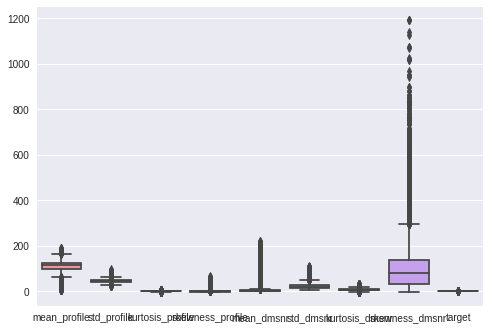

In [9]:
sns.boxplot(data = df)

In [10]:
#sns.heatmap(df.isnull())

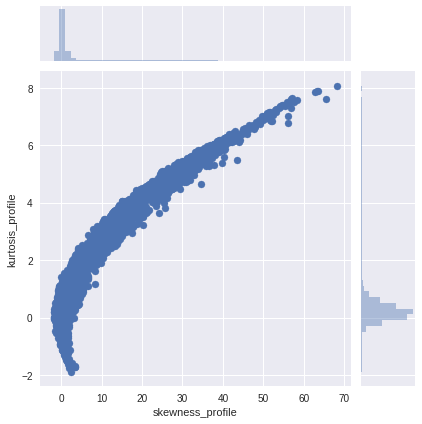

In [11]:
sns.jointplot( x= 'skewness_profile',y='kurtosis_profile',data=df)

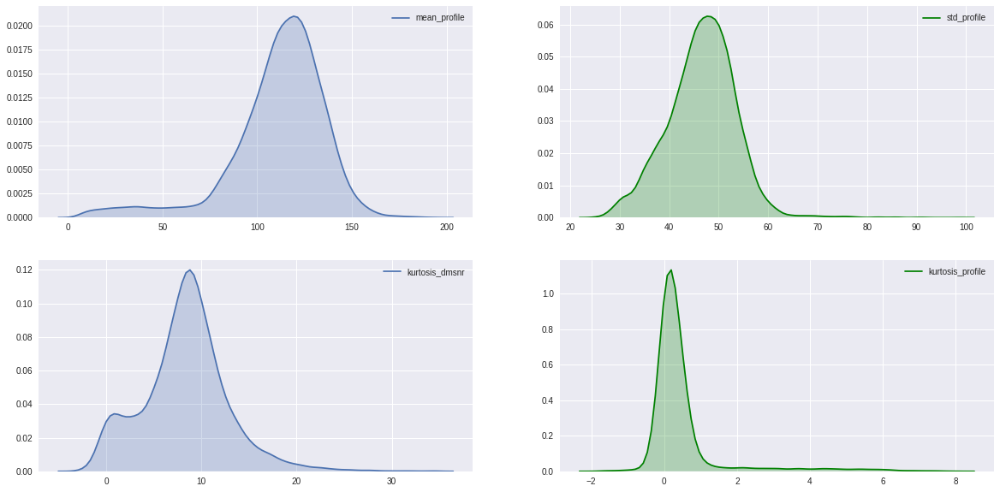

In [12]:
fig, axs  = plt.subplots(2, 2, figsize=(20, 10))

sns.kdeplot(df['mean_profile'], shade=True, ax=axs[0][0])
sns.kdeplot(df['std_profile'], shade=True, color='green', ax=axs[0][1])
sns.kdeplot(df['kurtosis_dmsnr'], shade=True, ax=axs[1][0])
sns.kdeplot(df['kurtosis_profile'], shade=True, color='green', ax=axs[1][1])

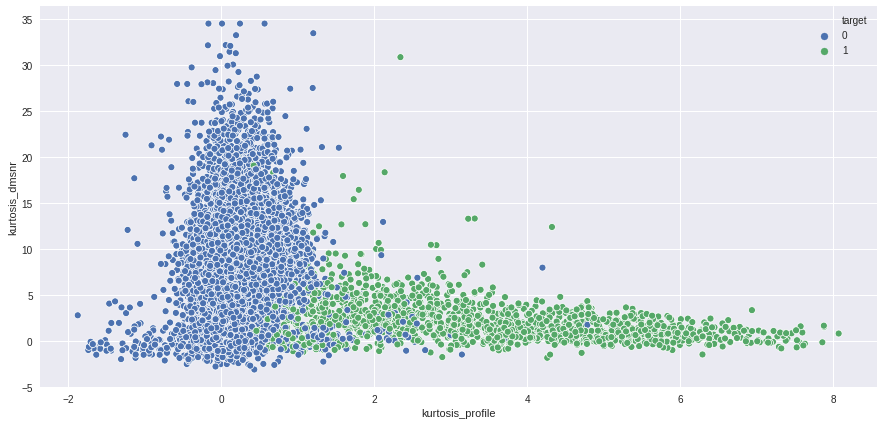

In [13]:
fig,ax = plt.subplots(figsize=(15,7))
sns.scatterplot(x='kurtosis_profile',y='kurtosis_dmsnr',hue='target',data=df)
plt.show()

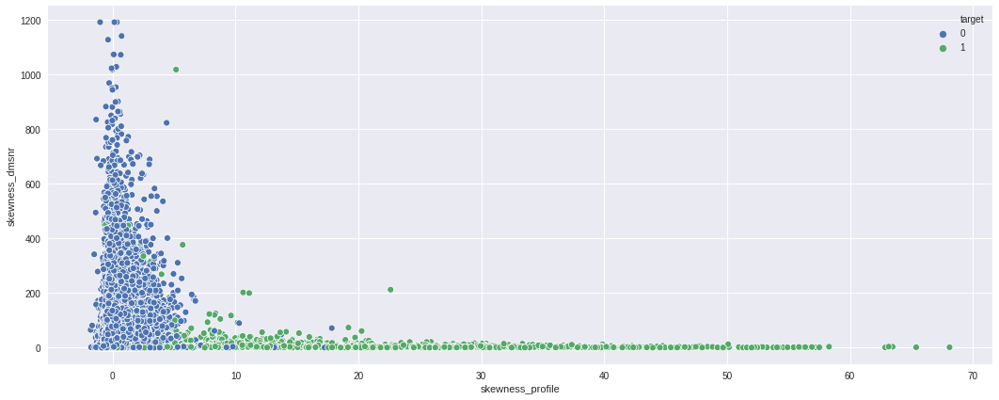

In [14]:
fig,ax = plt.subplots(figsize=(18,7))
sns.scatterplot(x='skewness_profile',y='skewness_dmsnr',hue='target',data=df)
plt.show()

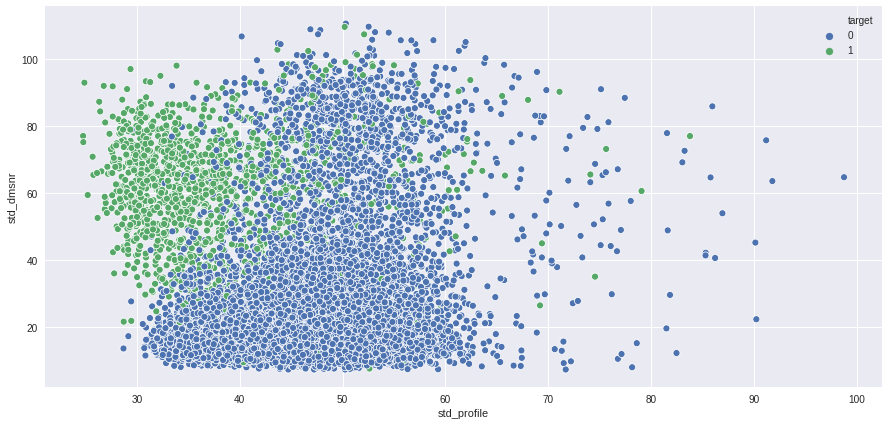

In [15]:
fig,ax = plt.subplots(figsize=(15,7))
sns.scatterplot(x='std_profile',y='std_dmsnr',hue='target',data=df)
plt.show()

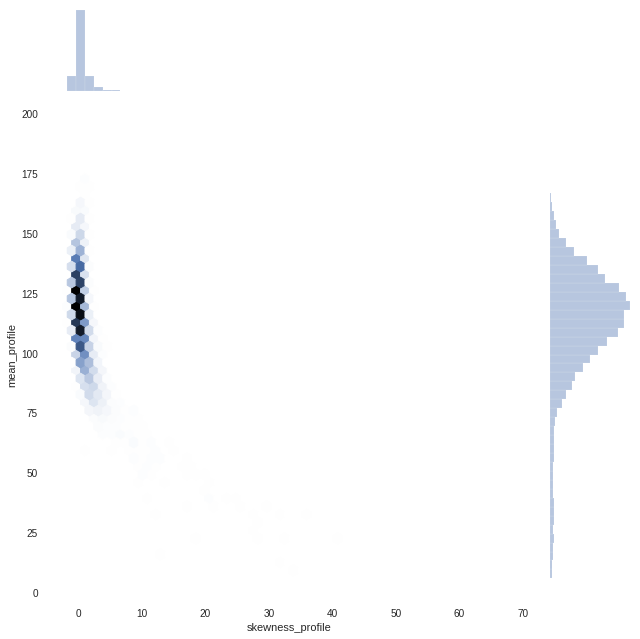

In [16]:
with sns.axes_style('white'):
    ax = sns.jointplot(x="skewness_profile", y="mean_profile", data=df, kind='hex', height=9)

## Machine Learning

In [89]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,log_loss,f1_score,confusion_matrix

In [90]:
X = df.drop(['target'],axis=1)
y = df.target

# DecisionTreeClassifier

In [91]:
X_train,X_test,y_train,y_test = train_test_split(X,y)
acc_rep = {}

In [92]:
model = DecisionTreeClassifier()
model.fit(X_train,y_train)
y_pred = model.predict(X_test)
print('Accuracy score : ',accuracy_score(y_test,y_pred)*100,'%')
acc_rep['DecisionTreeClassifier_log_loss'] = log_loss(y_test,y_pred)
acc_rep['DecisionTreeClassifier_f1_score'] = f1_score(y_test,y_pred)

Accuracy score :  96.87150837988827 %


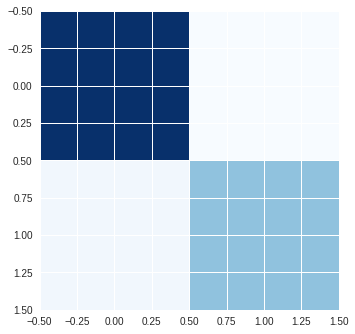

In [93]:
plt.imshow(np.log(confusion_matrix(y_test,y_pred)),cmap = 'Blues',interpolation='nearest')
plt.show()

# KnearestNeighbour

In [94]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score

In [95]:
scores,score,hscore,bestk = 0,0,0,0
for k in range(3,20):
    knnmodel =KNeighborsClassifier(n_neighbors=k)
    scores  = cross_val_score(knnmodel,X,y,cv=10)
    score = scores.mean()
    if score>hscore:
        hscore=score
        bestk = k
print('Best k is {} with cross_val_score : {}'.format(bestk,hscore))

Best k is 17 with cross_val_score : 0.9732931540044529


In [96]:
knn = KNeighborsClassifier(n_neighbors=bestk)
knn.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=17)

In [97]:
y_pred = knn.predict(X_test)

Accuracy score :  97.02793296089386 %


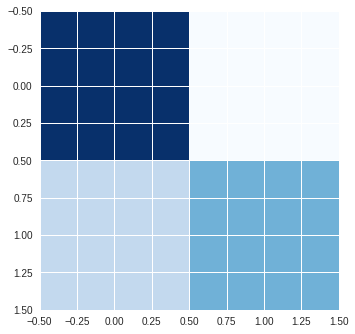

In [98]:
print('Accuracy score : ',accuracy_score(y_test,y_pred)*100,'%')
acc_rep['kNN_log_loss'] = log_loss(y_test,y_pred)
acc_rep['kNN_f1_score'] = f1_score(y_test,y_pred)
plt.imshow(np.log(confusion_matrix(y_test,y_pred)),cmap = 'Blues',interpolation='nearest')
plt.show()

# kMeans Clustering

In [99]:
from sklearn.cluster import KMeans
model = KMeans()
model.fit(X_train,y_train)
y_pred = model.predict(X_test)

Accuracy score :  96.80446927374302 %


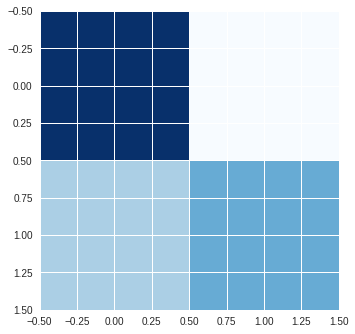

In [104]:
print('Accuracy score : ',accuracy_score(y_test,y_pred)*100,'%')
acc_rep['kMeans_Clustering_log_loss'] = log_loss(y_test,y_pred)
acc_rep['kMeans_Clustering_f1_score'] = f1_score(y_test,y_pred,average='binary')
plt.imshow(np.log(confusion_matrix(y_test,y_pred)),cmap = 'Blues',interpolation='nearest')
plt.show()

# SVM

In [105]:
from sklearn.svm import SVC
model = SVC()
model.fit(X_train,y_train)

SVC()

Accuracy score :  96.80446927374302 %


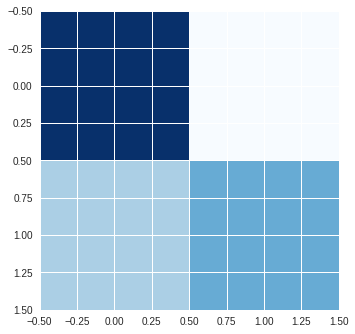

In [106]:
y_pred = model.predict(X_test)
print('Accuracy score : ',accuracy_score(y_test,y_pred)*100,'%')
acc_rep['SVM_log_loss'] = log_loss(y_test,y_pred)
acc_rep['SVM_f1_score'] = f1_score(y_test,y_pred)
plt.imshow(np.log(confusion_matrix(y_test,y_pred)),cmap = 'Blues',interpolation='nearest')
plt.show()

# Accuracy Report

---

In [107]:
acc_rep

{'DecisionTreeClassifier_log_loss': 1.08055451814925,
 'DecisionTreeClassifier_f1_score': 0.8341232227488152,
 'kNN_log_loss': 1.0265207706924246,
 'kNN_f1_score': 0.8288288288288288,
 'kMeans_Clustering_log_loss': 1.1037009644733555,
 'SVM_log_loss': 1.1037009644733555,
 'SVM_f1_score': 0.8095872170439414,
 'kMeans_Clustering_f1_score': 0.8095872170439414}

| Algorithm | Log_Loss | F1_Score | Accuracy (%)
|-----------|----------|----------|----------|
|DecisionTreeClassifier | 1.17|0.82 | 97.6|
|KNN | 0.93| 0.85| 96.2|
|kMeans | 33.19|NA | 97.2|
|SVM | 0.93|0.84 | 97.2|
 